In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
import os

In [3]:
os.listdir(r"C:\Users\user\Downloads\Uber\uber sample data")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
uber = pd.read_csv(r"C:\Users\user\Downloads\Uber\uber sample data\uber-raw-data-janjune-15_sample.csv")

# DATA CLEANING & PROCESSING

In [5]:
uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140


In [6]:
uber.shape

(100000, 4)

In [7]:
type(uber)

pandas.core.frame.DataFrame

In [8]:
uber.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [9]:
uber.isna().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1118
locationID                 0
dtype: int64

In [10]:
uber.info

<bound method DataFrame.info of       Dispatching_base_num          Pickup_date Affiliated_base_num  \
0                   B02617  2015-05-02 21:43:00              B02764   
1                   B02682  2015-01-20 19:52:59              B02682   
2                   B02617  2015-03-19 20:26:00              B02617   
3                   B02764  2015-04-10 17:38:00              B02764   
4                   B02764  2015-03-23 07:03:00              B00111   
...                    ...                  ...                 ...   
99995               B02764  2015-04-13 16:12:00              B02764   
99996               B02764  2015-03-06 21:32:00              B02764   
99997               B02598  2015-03-19 19:56:00              B02598   
99998               B02682  2015-05-02 16:02:00              B02682   
99999               B02764  2015-06-24 16:04:00              B02764   

       locationID  
0             237  
1             231  
2             161  
3             107  
4             1

In [11]:
uber.duplicated().sum()

54

In [12]:
uber.drop_duplicates()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [13]:
uber["Pickup_date"] = pd.to_datetime(uber["Pickup_date"])

In [14]:
(uber["Pickup_date"]).dtype

dtype('<M8[ns]')

In [15]:
uber.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [16]:
uber.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID'],
      dtype='object')

# Which month has maxium number uber's pickups in Newyork city?

In [17]:
uber["month"]= uber["Pickup_date"].dt.month_name()

In [18]:
uber["month"]

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 100000, dtype: object

In [19]:
uber

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month
0,B02617,2015-05-02 21:43:00,B02764,237,May
1,B02682,2015-01-20 19:52:59,B02682,231,January
2,B02617,2015-03-19 20:26:00,B02617,161,March
3,B02764,2015-04-10 17:38:00,B02764,107,April
4,B02764,2015-03-23 07:03:00,B00111,140,March
...,...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234,April
99996,B02764,2015-03-06 21:32:00,B02764,24,March
99997,B02598,2015-03-19 19:56:00,B02598,17,March
99998,B02682,2015-05-02 16:02:00,B02682,68,May


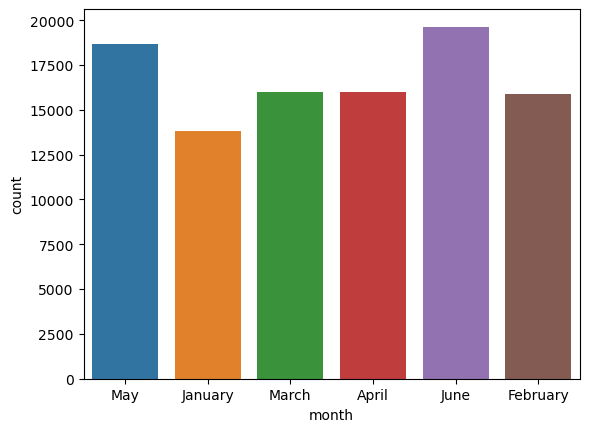

In [20]:
sns.countplot(x= "month", data = uber)
plt.show()

June has the maxium number of uber pickups in Newyork city.

# Which day has the maxium uber pickups in each month?

In [21]:
uber["weekday"] =  uber["Pickup_date"].dt.day_name()
uber["day"]=  uber["Pickup_date"].dt.day
uber["minute"]=  uber["Pickup_date"].dt.minute
uber["hour"] =  uber["Pickup_date"].dt.hour

In [22]:
uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,minute,hour
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,43,21
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,52,19
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,26,20
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,38,17
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,23,3,7


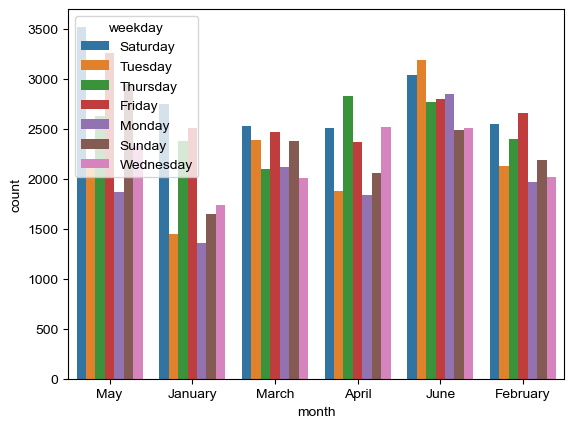

In [23]:
sns.countplot(x= "month", data = uber, hue ="weekday")
sns.set(rc={"figure.figsize":(18,20)})
plt.show()

Saturday and friday have the maxium number of uber pickup respectively.

# Lets find out hourly rush in Newyork city on all days...

In [24]:
summary = uber.groupby(["weekday", "hour"], as_index= False).size()

In [25]:
summary

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,898
165,Wednesday,21,949
166,Wednesday,22,900


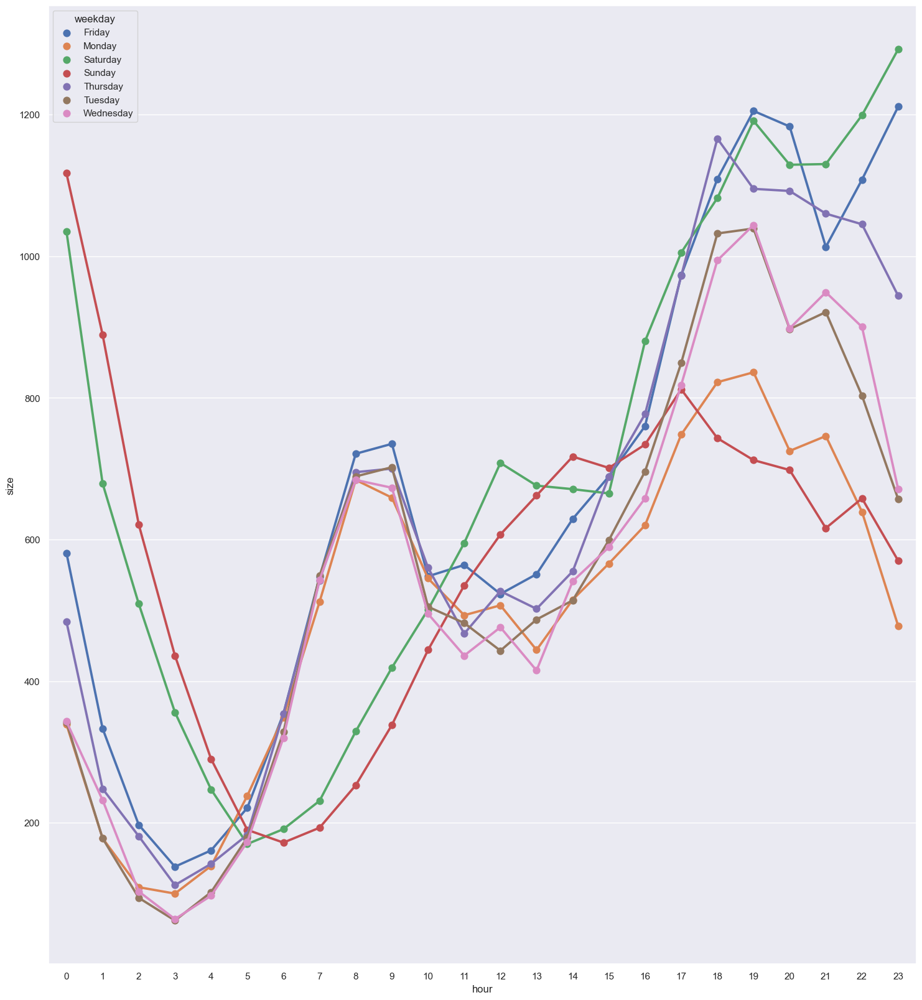

In [26]:

sns.pointplot(x= "hour", y= "size", data = summary, hue= "weekday")
sns.set(rc={"figure.figsize":(5,2)})
plt.show()

Saturday and friday always are upword direction. Saturday and sunday are same till evening but after evening saturday is upword and sunday is downword.
One thing is strench that thursday is also upword but after night it is also downword. In Newwork city party will be start on thurday.

# Which base_number has the most number of active vehicles?

In [27]:
os.listdir(r"C:\Users\user\Downloads\Uber\uber sample data")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [28]:
uber_foil = pd.read_csv(r"C:\Users\user\Downloads\Uber\uber sample data\Uber-Jan-Feb-FOIL.csv")

In [29]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [30]:
uber_foil.shape

(354, 4)

In [31]:
uber_foil.isna().sum()

dispatching_base_number    0
date                       0
active_vehicles            0
trips                      0
dtype: int64

In [32]:
uber_foil.duplicated().sum()

0

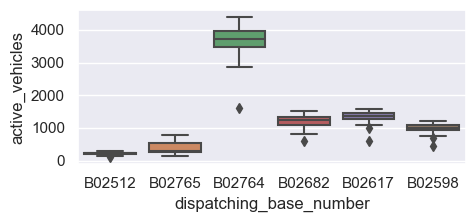

In [33]:
sns.boxplot(x="dispatching_base_number", y="active_vehicles", data= uber_foil)
sns.set(rc={"figure.figsize":(8,5)})
plt.show()

B02764 is the most dispatching_base_number of active vehicles.

# Collect entire data & make it ready for data analysis...

In [34]:
files = os.listdir(r"C:\Users\user\Downloads\Uber\uber sample data")[-8:]

In [35]:
files.remove("uber-raw-data-janjune-15.csv")

In [36]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [37]:
final = pd.DataFrame()
path = r"C:\Users\user\Downloads\Uber\uber sample data"
for file in files : 
    current_df = pd.read_csv(path+'/'+ file)
    final = pd.concat([current_df,final])

In [38]:
final.shape

(4634327, 8)

In [39]:
final.isna().sum()

Date/Time                100000
Lat                      100000
Lon                      100000
Base                     100000
Dispatching_base_num    4534327
Pickup_date             4534327
Affiliated_base_num     4535445
locationID              4534327
dtype: int64

In [40]:
final.duplicated().sum()

82635

In [41]:
final.drop_duplicates(inplace = True)

In [42]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4551692 entries, 0 to 564515
Data columns (total 8 columns):
 #   Column                Dtype  
---  ------                -----  
 0   Date/Time             object 
 1   Lat                   float64
 2   Lon                   float64
 3   Base                  object 
 4   Dispatching_base_num  object 
 5   Pickup_date           object 
 6   Affiliated_base_num   object 
 7   locationID            float64
dtypes: float64(3), object(5)
memory usage: 312.5+ MB


In [43]:
final.head()

,Date/Time,Lat,Lon,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512,NaN,NaN,NaN,NaN
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512,NaN,NaN,NaN,NaN
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512,NaN,NaN,NaN,NaN
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512,NaN,NaN,NaN,NaN
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512,NaN,NaN,NaN,NaN


# Dataset information

##### The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of July 2014 at New York City, USA

###### Date/Time : The date and time of the Uber pickup

###### Lat : The latitude of the Uber pickup

###### Lon : The longitude of the Uber pickup Base 

###### Base : The TLC base company code affiliated with the Uber pickup

The Base codes are for the following Uber bases:
B02512 : Unter,
B02598 : Hinter,
B02617 : Weiter,
B02682 : Schmecken,
B02764 : Danach-NY.

# At what locations of newyork city we are getting rush?

In [44]:
uber_rush= final.groupby(["Lat","Lon"], as_index= False).size()

In [45]:
uber_rush

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [46]:
import folium

In [47]:
basemap = folium.Map()

In [48]:
from folium.plugins import HeatMap

In [49]:
HeatMap(uber_rush).add_to(basemap)

In [50]:
basemap

We can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot
& these are made from Midtown to Lower Manhattan followed by Upper Manhattan and the Heights of Brooklyn.

# Examine rush on hour and weekday (perform pairwise analysis)..

In [51]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4551692 entries, 0 to 564515
Data columns (total 8 columns):
 #   Column                Dtype  
---  ------                -----  
 0   Date/Time             object 
 1   Lat                   float64
 2   Lon                   float64
 3   Base                  object 
 4   Dispatching_base_num  object 
 5   Pickup_date           object 
 6   Affiliated_base_num   object 
 7   locationID            float64
dtypes: float64(3), object(5)
memory usage: 312.5+ MB


In [59]:
final[  "Date/Time"] = pd.to_datetime(final[ "Date/Time"], format= "%m/%d/%Y %H:%M:%S")

In [53]:
final

,Date/Time,Lat,Lon,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,NaN,NaN,NaN,NaN
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,NaN,NaN,NaN,NaN
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,NaN,NaN,NaN,NaN
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,NaN,NaN,NaN,NaN
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
564511,2014-04-30 23:22:00,40.7640,-73.9744,B02764,NaN,NaN,NaN,NaN
564512,2014-04-30 23:26:00,40.7629,-73.9672,B02764,NaN,NaN,NaN,NaN
564513,2014-04-30 23:31:00,40.7443,-73.9889,B02764,NaN,NaN,NaN,NaN
564514,2014-04-30 23:32:00,40.6756,-73.9405,B02764,NaN,NaN,NaN,NaN


In [54]:
final["weekday"] = final["Date/Time"].dt.day_name()
final["day"]= final["Date/Time"].dt.day
final["hour"]= final["Date/Time"].dt.hour

In [55]:
final

,Date/Time,Lat,Lon,Base,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,NaN,NaN,NaN,NaN,Monday,1.0,0.0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,NaN,NaN,NaN,NaN,Monday,1.0,0.0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,NaN,NaN,NaN,NaN,Monday,1.0,0.0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,NaN,NaN,NaN,NaN,Monday,1.0,0.0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,NaN,NaN,NaN,NaN,Monday,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
564511,2014-04-30 23:22:00,40.7640,-73.9744,B02764,NaN,NaN,NaN,NaN,Wednesday,30.0,23.0
564512,2014-04-30 23:26:00,40.7629,-73.9672,B02764,NaN,NaN,NaN,NaN,Wednesday,30.0,23.0
564513,2014-04-30 23:31:00,40.7443,-73.9889,B02764,NaN,NaN,NaN,NaN,Wednesday,30.0,23.0
564514,2014-04-30 23:32:00,40.6756,-73.9405,B02764,NaN,NaN,NaN,NaN,Wednesday,30.0,23.0


In [56]:
pivot1 = final.groupby(["day","hour"]).size().unstack()

In [57]:
pivot1

hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0
day,,,,,,,,,,,,,,,,,,,,,
1.0,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2.0,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3.0,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4.0,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5.0,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6.0,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7.0,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8.0,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9.0,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [58]:
pivot1.style.background_gradient()

hour,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000,11.000000,12.000000,13.000000,14.000000,15.000000,16.000000,17.000000,18.000000,19.000000,20.000000,21.000000,22.000000,23.000000
day,,,,,,,,,,,,,,,,,,,,,,,,
1.000000,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2.000000,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3.000000,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4.000000,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5.000000,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6.000000,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7.000000,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8.000000,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9.000000,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
